# MiniProject2: Breaking the Panorama Code

Name: Michael Tenkorang

Solo

## Learning Objective

By the end of this project you should be able to:

1. Understand and implement 2D convolution and key filters used in CV.
2. Implement a simple corner detector and descriptor and then match features.
3. Know how [RANSAC homography and a image stitching pipeline](https://visionbook.mit.edu/homography.html) work.
4. How these all can work together to produce a flyer with the stitched panorama.

6 + 6 + 6 + 6 + 2 = 26 pts

## Your work here



*  Start by reading the tasks in order.
*  Pick an existing panorama image or a regular image.

For panorama, [there are lots of images here](https://www.pexels.com/search/panorama/).


* For each task make sure that after your code, the output image appears.

    Try also showing intermediate images whenever you can.


* Write 1-2 lines of note for what you observe.
Even if you fund a solution on the web for completing apartcular short task, you should always ask, **why am I using this approach**?

* For some questions, you will need to do a bit of research on your own.


### Storyline

The campus festival just ended. Someone dumped ~50 unordered photos into a folder — different phones, different exposures, some blurry. some with low light. By sunrise, you, as the president 'Sunrise Photography Club' must deliver a gorgeous flyer with a  panorama and 2-3 nice scene description go with it.

See this [image](https://magazine.colby.edu/issue/vol-112-issue-1/#wilderness) from Colby Magazine for inspiration.



### Environment

In [2]:
# If running in Colab, please uncomment:
# !pip -q install opencv-python-headless==4.10.0.84 reportlab==4.2.2 scikit-image==0.24.0
import numpy as np, cv2, math, os, glob
from pathlib import Path
import matplotlib.pyplot as plt
print("OpenCV:", cv2.__version__)


# It is mot mandatory to use these versions


OpenCV: 4.12.0


### Get the data


To get your data you have three options:

1. Slice a large panorama into overlapping tiles.
[there are lots of images here](https://www.pexels.com/search/panorama/).
2. Programmatically generate slices from an image with 30% overlap
3. To make it look like individual images, apply motion blur/noise to make it look messy

In [88]:
image = cv2.imread("./data/pexels-nextvoyage-457937.avif")

print(image.shape)

(580, 1258, 3)


##### Creating sliced images with variations using sliding window

Generated 20 sliced images
Each slice dimensions: (580, 943, 3)


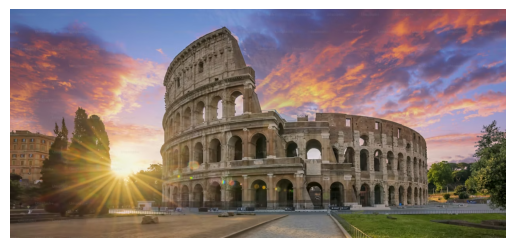

In [89]:
plt.figure(frameon=False)

# Calculate dimensions for 75% width slices
slice_width = int(image.shape[1] * 0.75)
total_width = image.shape[1]

# Calculate shift amount to get approximately 20 images
num_images = 20
total_shift_range = total_width - slice_width
shift_amount = total_shift_range // (num_images - 1) if num_images > 1 else 0

# Generate sliced images
images = []
start_pos = 0

while start_pos + slice_width <= total_width:
    slice_img = image[:, start_pos:start_pos + slice_width, :]
    images.append(slice_img)
    start_pos += shift_amount
    
    # Stop if we've generated enough images
    if len(images) >= num_images:
        break

# Add the final slice if we haven't reached it
if len(images) < num_images and start_pos < total_width:
    final_slice = image[:, -slice_width:, :]
    images.append(final_slice)

print(f"Generated {len(images)} sliced images")
print(f"Each slice dimensions: {images[0].shape if images else 'N/A'}")

# Display the original image
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()


### Create your data folder

Create a folder like `/content/data/fest` (in Colab) or `./data/fest` (in local) with **30–50 images** of one scene. Aim for ≥30% overlap and mostly rotational motion around one point. Avoid close moving subjects.

Tip: Try your entire pipeline with 6–8 images first before scaling up.


##### Generating multiple slices of original image

In [90]:

for i, img in enumerate(images):

    if cv2.waitKey(1000) & 0xFF == ord('q'):
        break

    cv2.imwrite(f"./data/fest/fest_image_{i}.jpg", img)



### Task 1: Implement at least 4 filters from `conv2d`,  Gaussian, Sobel X/Y, emboss, etc. (6 pts)

Test on a few **64×64** images and compare to OpenCV numerically.

Tip: You can resize your image for this step.

**Resource**:
1. [How does kernels or filter work](https://setosa.io/ev/image-kernels/)? Visualize here.


In [91]:
def show_image(img: np.ndarray, title: str = ""):
    """
    Displays image in the cell output using matplotlib
    """
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.title(title) 
    plt.axis("off")
    plt.imshow(img)
    plt.show()

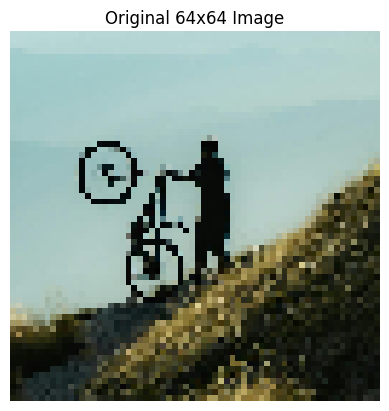

(64, 64, 3)


In [92]:
#Your code goes here
image = cv2.imread("./data/pexels-sandro-tedeschini-694018589-34026724.jpg")
image = cv2.resize(image[2500:4000, 1700:3250, :], (64, 64))

show_image(image, title="Original 64x64 Image")
print(image.shape)

#### Implementation of Conv2d

In [93]:
def conv2d(image, kernel):
    """
    Apply 2D convolution to an image using the given kernel
    
    Args:
        image (np.ndarray): Input image array
        kernel (np.ndarray): Convolution kernel
    
    Returns:
        np.ndarray: Convolved image
    """

    image = image.astype(np.float32)
    kernel = kernel.astype(np.float32)

    # Getting dimensions for image and kernel
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape

    # Resulting image
    output = np.zeros(image.shape, dtype=np.float32)

    # Adding padding around image
    padded_image = np.pad(image, ((kernel_height//2, kernel_height//2), (kernel_width//2, kernel_width//2)), mode='constant', constant_values=0)

    # Convolving with kernel
    for y in range(image_height):
        for x in range(image_width):
            patch = padded_image[y:y + kernel_height, x:x + kernel_width]
            output[y, x] = np.sum(patch * kernel)

    return output



##### Gaussian Blur Filter

In [94]:
def generate_gaussian_kernel(size, sigma=1):
    coords = np.linspace(-(size//2), size//2, size)
    X, Y = np.meshgrid(coords, coords)

    kernel = np.exp(-(X**2 + Y**2)/2*sigma**2)
    return kernel/kernel.sum()

def gaussian_blur(image: np.ndarray, size=3, sigma=1):
   kernel = generate_gaussian_kernel(size=size, sigma=sigma) 
   return cv2.filter2D(image, -1, kernel=kernel)


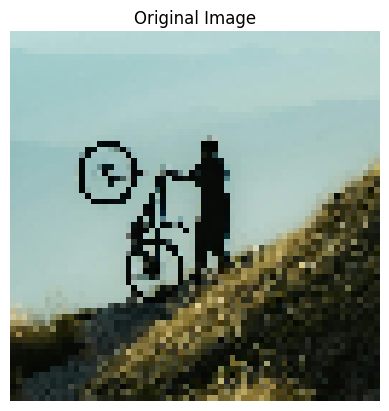

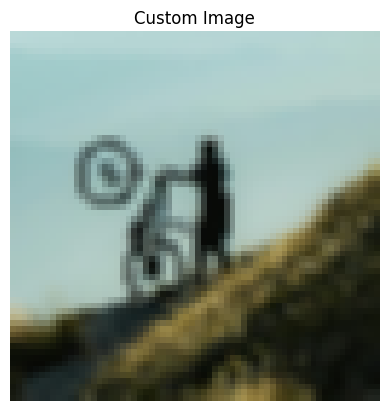

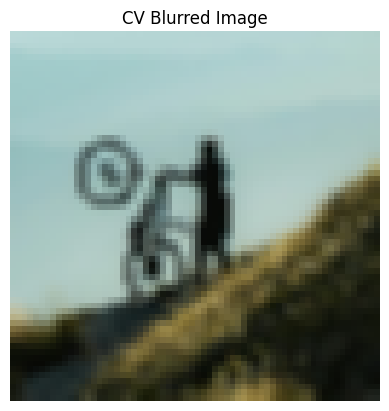

In [95]:
show_image(image, title="Original Image")

custom_blurred_image = gaussian_blur(image)
show_image(custom_blurred_image, title="Custom Image")

cv_blurred_image = cv2.GaussianBlur(image, (3, 3), 1)
show_image(cv_blurred_image, title="CV Blurred Image")


##### Calculating Numerical Difference

In [96]:
print(f"The numerical difference between the custom Gaussian blur and the CV Gaussian Blur is {np.sum(cv_blurred_image - custom_blurred_image)}")

The numerical difference between the custom Gaussian blur and the CV Gaussian Blur is 29177


I notice here that even with the actual formula I got from Wikipedia (that uses the $\frac{1}{2\pi\sigma^2}$) was substantially numerically different from that of openCV but when normalized with the sum of the kernel, the difference is a lot closer. Also they look more visually similar. The way I generated the kernel was so that the farther neighbours have lower influence on the value of the pixels.

##### Sobel Filter

In [97]:
def generate_sobel_x(src, ddepth=cv2.CV_64F, ksize=3, normalize=False):
    kx, ky = cv2.getDerivKernels(1, 0, ksize=ksize, normalize=normalize, ktype=cv2.CV_64F)
    return cv2.sepFilter2D(src, ddepth, kx, ky)

def generate_sobel_y(src, ddepth=cv2.CV_64F, ksize=3, normalize=False):
    kx, ky = cv2.getDerivKernels(0, 1, ksize=ksize, normalize=normalize, ktype=cv2.CV_64F)
    return cv2.sepFilter2D(src, ddepth, kx, ky)

def generate_sobel_diag(src, ddepth=cv2.CV_64F, ksize=3, normalize=False):
    kx, ky = cv2.getDerivKernels(1, 1, ksize=ksize, normalize=normalize, ktype=cv2.CV_64F)
    return cv2.sepFilter2D(src, ddepth, kx, ky) 

def generate_sobel(src, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3, normalize=False):
    kx, ky = cv2.getDerivKernels(dx, dy, ksize=ksize, normalize=normalize, ktype=cv2.CV_64F)
    return cv2.sepFilter2D(src, ddepth, kx, ky)

In [98]:
def generate_sobel_x_kernel(ksize=3):
    kx, ky = cv2.getDerivKernels(1, 0, ksize=ksize, normalize=False, ktype=cv2.CV_64F)
    return np.outer(kx, ky)

def generate_sobel_y_kernel(ksize=3):
    kx, ky = cv2.getDerivKernels(0, 1, ksize=ksize, normalize=False, ktype=cv2.CV_64F)
    return np.outer(kx, ky)

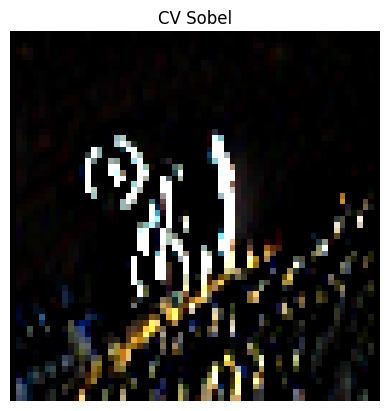

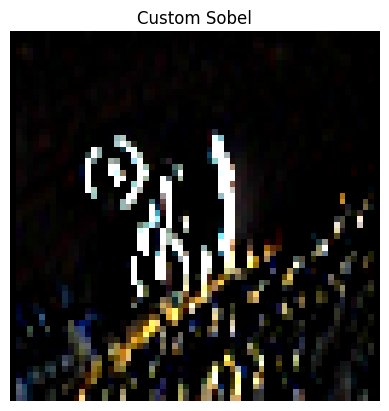

In [99]:
cv_sobel_x_image = cv2.Sobel(image, -1, 1, 0)
show_image(cv_sobel_x_image, title="CV Sobel")
custom_sobel_x_image = generate_sobel(image, -1, 1, 0)
show_image(custom_sobel_x_image, title="Custom Sobel")

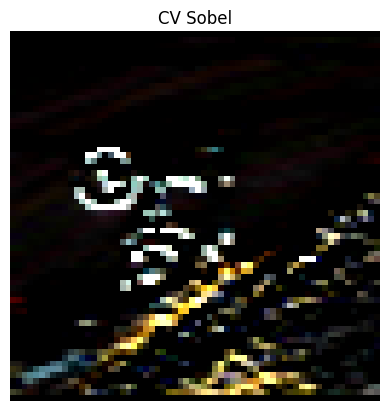

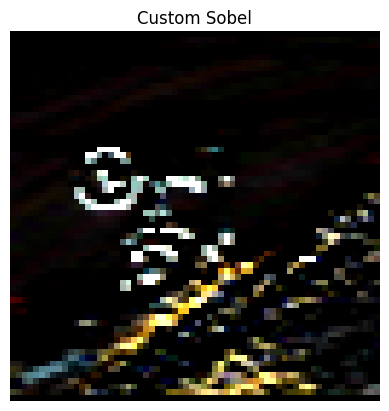

In [100]:
cv_sobel_y_image = cv2.Sobel(image, -1, 0, 1)
show_image(cv2.Sobel(image, -1, 0, 1), title="CV Sobel")
custom_sobel_y_image = generate_sobel(image, -1, 0, 1)
show_image(custom_sobel_y_image, title="Custom Sobel")

In [101]:
print(f"Numerical Difference for Sobel X: {np.sum(cv_sobel_x_image - custom_sobel_x_image)}")
print(f"Numerical Difference for Sobel Y: {np.sum(cv_sobel_y_image - custom_sobel_y_image)}")

Numerical Difference for Sobel X: 0
Numerical Difference for Sobel Y: 0


For the sobel implementation, I initialize wrote the hardcoded values of the kernel but changed to using the method `getDerivKernels` so I wouldn't have to manually implement the kernel for varying `ksize` values.
Thus, I was able to write the implementation for Sobel X, Sobel Y and Sobel Diagonal

From our results, we can see that the implementation of the Sobel method most likely uses the `getDerivKernel` method under the hood to compute the Sobel gradients

##### Sharpening Filter

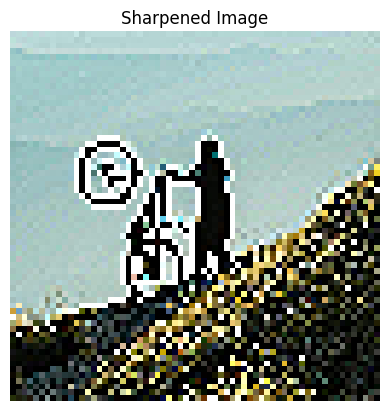

In [102]:
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

sharpened_image = cv2.filter2D(image, -1, kernel=kernel)
show_image(sharpened_image, title="Sharpened Image")


There is no sharpen method for the convolving an image with the sharpening kernel

##### Emboss Filter

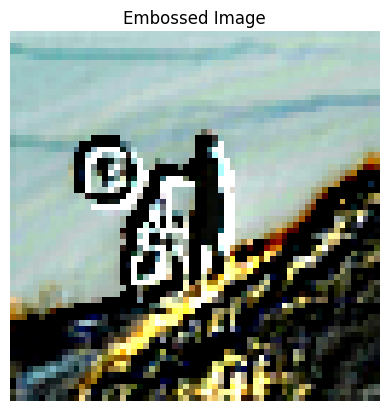

In [103]:
kernel = np.array([
    [-2, -1, 0],
    [-1, 1, 1],
    [0, 1, 2]
])

embossed_image = cv2.filter2D(image, -1, kernel)
show_image(embossed_image, title="Embossed Image")

There was no OpenCV implementation for emboss. Standard is this same approach

##### Outline Filter

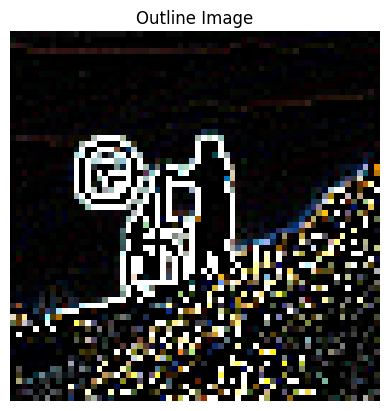

In [104]:
kernel = np.array([
    [-1, -1, -1],
    [-1, 8, -1],
    [-1, -1, -1]
])

outline_image = cv2.filter2D(image, -1, kernel)
show_image(outline_image, title="Outline Image")

### Task 2: Apply Harris Corners + Patch Descriptor (6 pts)
1. Compute Harris response on a blurred grayscale image.  
2. Non-max suppression to keep top **N** corners.  
3. For each corner, compute dominant gradient orientation and extract a **15×15** patch, rotate to 0°, normalize (zero-mean, unit-var), downsample to **9×9**, flatten.




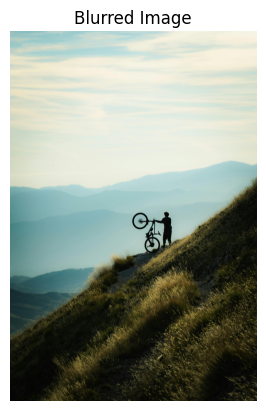

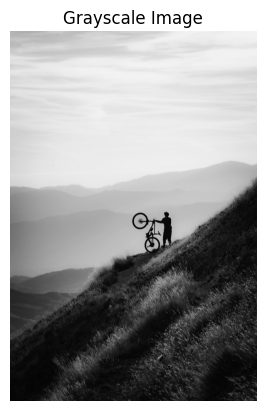

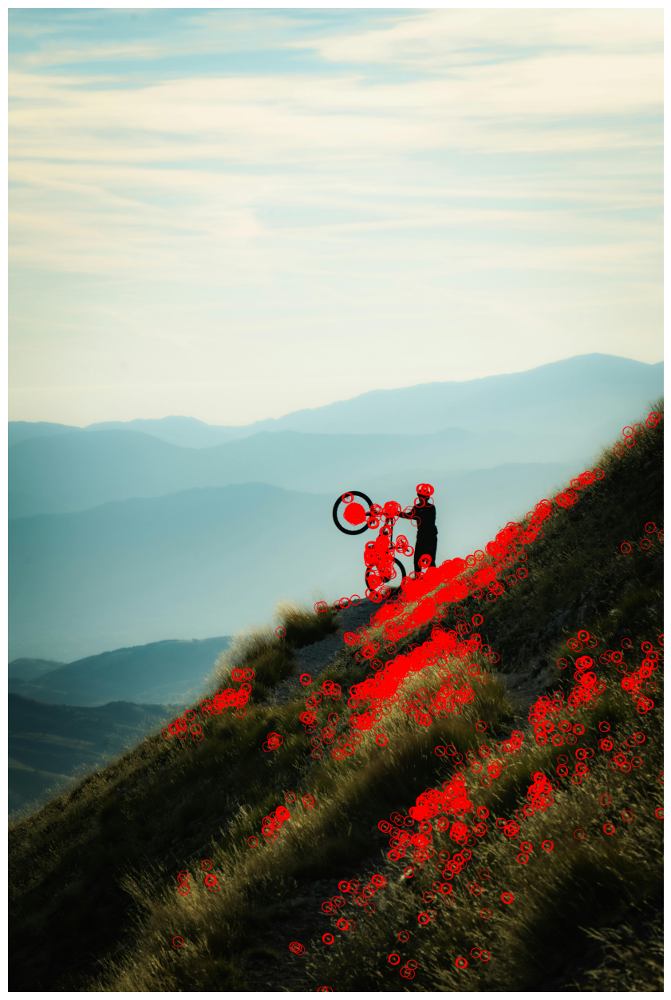

In [ ]:
image = cv2.imread("./data/pexels-sandro-tedeschini-694018589-34026724.jpg")
blurred_image = cv2.blur(image, (10, 10))
plt.figure(frameon=False)
show_image(blurred_image, title="Blurred Image")
plt.show()

gray_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2GRAY)
plt.figure(frameon=False)
show_image(gray_image, title="Grayscale Image")
plt.show()

gray_image = np.float32(gray_image)
dst = cv2.cornerHarris(gray_image, 2, 3, 0.04)
dst = cv2.dilate(dst, None)

# Mark corners with red color
image[dst > 0.01 * dst.max()] = [0, 0, 255]

# Draw circles around detected corners
corner_coords = np.argwhere(dst > 0.01 * dst.max())
for y, x in corner_coords:
    cv2.circle(image, (x, y), 30, (0, 0, 255), 1)

plt.figure(frameon=False, figsize=(16, 16))
plt.title("Harris Corners with Circles")
show_image(image)

### Task 2: Apply Harris Corners + Patch Descriptor (6 pts)
1. Compute Harris response on a blurred grayscale image.  
2. Non-max suppression to keep top **N** corners.  
3. For each corner, compute dominant gradient orientation and extract a **15×15** patch, rotate to 0°, normalize (zero-mean, unit-var), downsample to **9×9**, flatten.




In [ ]:
def compute_harris_response(image, k=0.04):
    """
    Calculate the Harris corner response for a grayscale image.
    """
    # Retrieve Sobel kernels for gradient computation
    sobel_x_kernel = generate_sobel_x_kernel()
    sobel_y_kernel = generate_sobel_y_kernel()

    # Calculate gradient components in x and y directions
    Ix = conv2d(image, sobel_x_kernel)
    Iy = conv2d(image, sobel_y_kernel)
    
    # Compute products of derivatives at each pixel
    Ixx = Ix * Ix
    Iyy = Iy * Iy 
    Ixy = Ix * Iy

    # Smooth the squared derivatives using Gaussian filter
    Sxx = gaussian_blur(Ixx, size=5, sigma=1.5)
    Syy = gaussian_blur(Iyy, size=5, sigma=1.5)
    Sxy = gaussian_blur(Ixy, size=5, sigma=1.5)

    # Calculate Harris corner response using determinant and trace
    det = (Sxx * Syy) - (Sxy * Sxy)
    trace = Sxx + Syy
    harris_response = det - k * (trace ** 2)

    print(f"Harris Response: {harris_response}")

    return harris_response
    

def non_max_suppression(harris_response, window_size=5, threshold=0.05):
    """
    Apply non-maximum suppression to identify local maxima in Harris response.
    """
    # Handle edge case of zero response
    max_response = np.max(harris_response)
    min_response = np.min(harris_response)
    
    # Normalize response values to [0, 1] range
    normalized_harris_response = harris_response / max_response - min_response

    # Extract image dimensions and calculate padding
    height, width = harris_response.shape
    padding = window_size // 2

    corners = []

    # Scan image excluding border regions
    for y in range(padding, height - padding):
        for x in range(padding, width - padding):
            current_response = normalized_harris_response[y, x]

            # Skip weak responses below threshold
            if current_response < threshold:
                continue

            # Extract local neighborhood around current pixel
            neighborhood = normalized_harris_response[
                y - padding:y + padding + 1, 
                x - padding:x + padding + 1
            ]
            
            # Keep only if current pixel is local maximum
            if current_response == np.max(neighborhood):
                corners.append((y, x))

    return corners


def select_top_n_corners(corners, harris_response, n=500):
    """
    Select the top N corners based on their Harris response magnitude.
    """

    if len(corners) == 0:
        return np.array([])

    # Associate each corner with its response strength
    corners_with_responses = [
        (y, x, harris_response[y, x]) for y, x in corners
    ]
    
    # Sort by response strength in descending order
    corners_with_responses.sort(key=lambda item: item[2], reverse=True)

    # Select top N corners (or all available if fewer than N)
    num_to_keep = min(n, len(corners_with_responses))
    return [(y, x) for y, x, _ in corners_with_responses[:num_to_keep]]


def compute_dominant_orientation(image, y, x, patch_size=15):
    """
    Determine the dominant gradient orientation around a corner point.
    """
    height, width = image.shape
    half_patch = patch_size // 2

    # Validate patch is within image bounds
    if (y - half_patch < 0 or y + half_patch + 1 > height or 
        x - half_patch < 0 or x + half_patch + 1 > width):
        return 0

    # Extract square patch centered at (y, x)
    patch = image[y - half_patch:y + half_patch + 1, 
                  x - half_patch:x + half_patch + 1]

    # Compute gradients using Sobel operators
    sobel_x = generate_sobel_x_kernel()
    sobel_y = generate_sobel_y_kernel()
    Gx = conv2d(patch, sobel_x)
    Gy = conv2d(patch, sobel_y)

    # Calculate gradient magnitude
    magnitude = np.sqrt(Gx**2 + Gy**2)

    # Compute weighted orientation components
    angles = np.arctan2(Gy, Gx)
    x_component = np.sum(magnitude * np.cos(angles))
    y_component = np.sum(magnitude * np.sin(angles))
    
    # Calculate dominant angle from aggregated components
    dominant_angle = np.arctan2(y_component, x_component)

    return dominant_angle


def extract_patch_descriptor(image, y, x, patch_size=15, final_size=9):
    """
    Extract a rotation-invariant patch descriptor for a corner point.
    """
    height, width = image.shape
    half_patch = patch_size // 2

    # Ensure patch fits within image boundaries
    if (y - half_patch < 0 or y + half_patch + 1 > height or 
        x - half_patch < 0 or x + half_patch + 1 > width):
        return None

    # Extract patch and convert to float32 for processing
    patch = image[y - half_patch:y + half_patch + 1, 
                  x - half_patch:x + half_patch + 1].astype(np.float32)

    # Determine canonical orientation
    angle = compute_dominant_orientation(image, y, x, patch_size)

    # Rotate patch to align with canonical orientation (0 degrees)
    center = (patch_size / 2, patch_size / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, -np.degrees(angle), 1.0)
    rotated_patch = cv2.warpAffine(patch, rotation_matrix, 
                                   (patch_size, patch_size))

    # Apply intensity normalization (zero mean, unit variance)
    mean = np.mean(rotated_patch)
    std = np.std(rotated_patch)

    if std > 0:
        normalized_patch = (rotated_patch - mean) / std
    else:
        normalized_patch = rotated_patch - mean

    # Downsample to final descriptor size
    descriptor_patch = cv2.resize(normalized_patch, (final_size, final_size), 
                                 interpolation=cv2.INTER_AREA)

    # Flatten to 1D feature vector
    descriptor = descriptor_patch.flatten()
    return descriptor


def detect_corners_and_extract_descriptors(image, num_of_corners=200, threshold=0.01):
    """
    Detect corners and extract feature descriptors from an image.
    """
    # Ensure image is in float format for processing
    if image.dtype == np.uint8:
        image = image.astype(np.float32)

    # Pre-process image with Gaussian smoothing
    gaussian_kernel = generate_gaussian_kernel(size=5, sigma=1.5)
    blurred = conv2d(image, gaussian_kernel)

    # Stage 1: Compute Harris corner response
    harris_response = compute_harris_response(blurred)

    # Stage 2: Apply non-maximum suppression
    all_corners = non_max_suppression(harris_response, 
                                     window_size=5, 
                                     threshold=threshold)
    print(f"[Detecting Harris Corners] Found {len(all_corners)} corners after NMS")

    # Stage 3: Select strongest corners
    top_corners = select_top_n_corners(all_corners, harris_response, num_of_corners)
    print(f"[Detecting Harris Corners] Selected top {len(top_corners)} corners")

    # Stage 4: Extract descriptors for each corner
    descriptors = []
    valid_corners = []

    for y, x in top_corners:
        descriptor = extract_patch_descriptor(blurred, y, x)

        if descriptor is not None:
            descriptors.append(descriptor)
            valid_corners.append((y, x))

    print(f"[Detecting Harris Corners] Extracted {len(descriptors)} valid descriptors")

    # Convert descriptor list to numpy array
    if len(descriptors) > 0:
        descriptors = np.array(descriptors)
    else:
        descriptors = np.array([]).reshape(0, 81)

    return valid_corners, descriptors

TASK 2: HARRIS CORNER DETECTION & PATCH DESCRIPTOR EXTRACTION

✓ Image loaded successfully
  Dimensions: 580 × 1258 pixels

Pipeline Configuration:
  Max corners: 100
  Response threshold: 0.01

Harris Response: [[ 2.0719468e+09  1.1032741e+09 -2.8411046e+08 ... -2.4381110e+08
   9.7504333e+08  1.8354412e+09]
 [ 1.1040717e+09  6.8322950e+08  1.1913016e+07 ...  9.9166240e+06
   6.0150093e+08  9.7750451e+08]
 [-2.8474010e+08  1.3061264e+07  4.9692310e+06 ...  4.3470210e+06
   1.2380416e+07 -2.4949642e+08]
 ...
 [-1.0343303e+08  1.3750034e+07  1.5898034e+06 ...  2.4098245e+06
   1.0826046e+07  2.0279220e+06]
 [ 6.2102189e+08  3.3692262e+08 -5.6338880e+06 ...  6.5604690e+06
   5.8583404e+07  8.6258976e+07]
 [ 1.1635437e+09  5.6113651e+08 -1.6712832e+08 ... -1.8261128e+07
   8.0443312e+07  1.3861936e+08]]
[Detecting Harris Corners] Found 722304 corners after NMS
[Detecting Harris Corners] Selected top 100 corners
[Detecting Harris Corners] Extracted 100 valid descriptors

DETECTION RESULTS


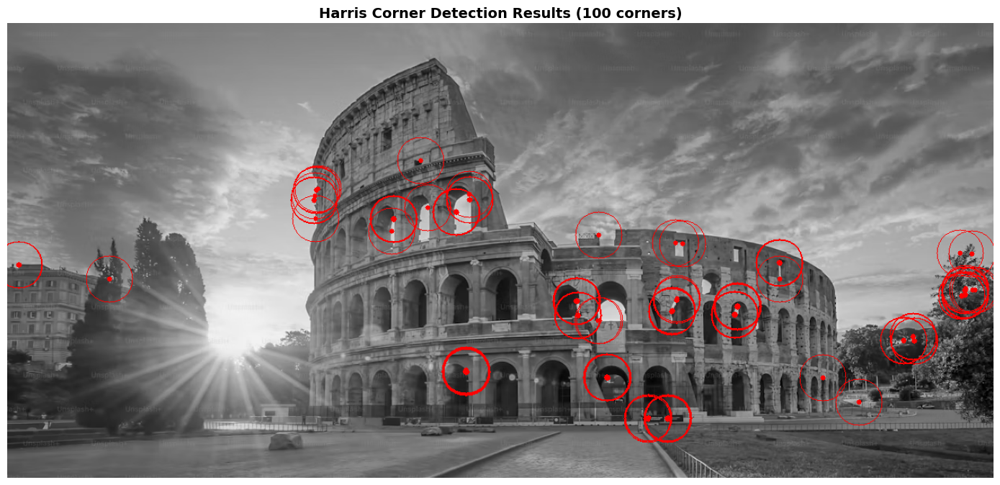

In [ ]:
import matplotlib.pyplot as plt

def visualize_detected_corners(image, corners, title="",
                               inner_radius=3, outer_radius=30, 
                               color=(0, 0, 255)):
    """
    Convenience plotter that draws little bullseyes where the Harris detector fired so I can sanity check detections.
    """
    # Convert to color if grayscale
    if len(image.shape) == 2:
        image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    else:
        image_color = image.copy()

    # Draw markers for each corner
    for y, x in corners:
        # Filled circle at corner location
        cv2.circle(image_color, (x, y), inner_radius, color, -1)
        # Hollow circle showing detection region
        cv2.circle(image_color, (x, y), outer_radius, color, 1)

    return image_color


# Main execution block for Task 2
print("=" * 70)
print("TASK 2: HARRIS CORNER DETECTION & PATCH DESCRIPTOR EXTRACTION")
print("=" * 70)
print()

# Load test image
image_path = '/Users/michaeltenkorangjr/courses/cs/366/Panorama-CV/data/pexels-nextvoyage-457937.avif'
test_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if test_image is None:
    raise FileNotFoundError(f"Failed to load image: {image_path}")

print(f"✓ Image loaded successfully")
print(f"  Dimensions: {test_image.shape[0]} × {test_image.shape[1]} pixels")
print()

# Execute corner detection and descriptor extraction pipeline
num_corners_to_detect = 100
response_threshold = 0.01

print(f"Pipeline Configuration:")
print(f"  Max corners: {num_corners_to_detect}")
print(f"  Response threshold: {response_threshold}")
print()

detected_corners, feature_descriptors = detect_corners_and_extract_descriptor(
    test_image, 
    num_of_corners=num_corners_to_detect, 
    threshold=response_threshold
)

# Display results summary
print()
print("=" * 70)
print("DETECTION RESULTS")
print("=" * 70)
print(f"✓ Total corners detected: {len(detected_corners)}")
print(f"✓ Descriptor matrix shape: {feature_descriptors.shape}")
print(f"  → {feature_descriptors.shape[0]} descriptors")
print(f"  → {feature_descriptors.shape[1]} dimensions each (9×9 patch flattened)")
print()

# Create visualization
annotated_image = visualize_detected_corners(
    test_image, 
    detected_corners,
    title=f'Harris Corners: {len(detected_corners)} detected'
)

# Display annotated image
plt.figure(figsize=(14, 10))
plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
plt.title(f'Harris Corner Detection Results ({len(detected_corners)} corners)', 
          fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()

# Save visualization
output_path = './task2_harris_corners_visualization.png'
plt.savefig(output_path, dpi=150, bbox_inches='tight', facecolor='white')
print(f"✓ Visualization saved: {output_path}")

plt.show()

### Task3: Stitching together an image with RANSAC Homography (6 pts)

We need this step since each image would be taken at a slightly different angle.

**Homography**: Projective – mapping between any two projection
planes with the same center of projection.

**Resource**: [OpenCV Homography](https://docs.opencv.org/3.4/d1/de0/tutorial_py_feature_homography.html)



In [ ]:
# ============================================================================
# Task 3: RANSAC Homography and Image Stitching Pipeline
# ============================================================================

def match_descriptors(descriptors1, descriptors2, ratio_threshold=0.75):
    """
    Match feature descriptors between two images using Lowe's ratio test.
    """
    # Handle edge cases with empty descriptor sets
    if len(descriptors1) == 0 or len(descriptors2) == 0:
        return []

    matched_pairs = []

    # Iterate through each descriptor in the first image
    for idx1, descriptor1 in enumerate(descriptors1):
        # Calculate Euclidean distances to all descriptors in second image
        distances = np.sqrt(np.sum((descriptors2 - descriptor1) ** 2, axis=1))

        # Sort distances to find nearest and second-nearest neighbors
        sorted_indices = np.argsort(distances)

        # Skip if insufficient neighbors for ratio test
        if len(sorted_indices) < 2:
            continue

        # Extract distances to two nearest neighbors
        nearest_distance = distances[sorted_indices[0]]
        second_nearest_distance = distances[sorted_indices[1]]

        # Apply Lowe's ratio test for match quality
        if nearest_distance < ratio_threshold * second_nearest_distance:
            matched_pairs.append((idx1, sorted_indices[0]))

    return matched_pairs


def get_matched_points(corners1, corners2, matches):
    """
    Convert corner index pairs to coordinate arrays for geometric transforms.
    """
    points1 = []
    points2 = []

    for idx1, idx2 in matches:
        # Extract corner coordinates (stored as y, x)
        y1, x1 = corners1[idx1]
        y2, x2 = corners2[idx2]

        # Convert to (x, y) format for homography computation
        points1.append([x1, y1])
        points2.append([x2, y2])

    return (np.array(points1, dtype=np.float32), 
            np.array(points2, dtype=np.float32))


def compute_homography(src_points, dst_points):
    """
    Calculate homography matrix from four point correspondences using DLT.
    """
    # Build the constraint matrix A for DLT algorithm
    A = []

    for i in range(4):
        x, y = src_points[i]
        u, v = dst_points[i]

        # Each correspondence contributes two rows to the constraint matrix
        A.append([-x, -y, -1, 0, 0, 0, u*x, u*y, u])
        A.append([0, 0, 0, -x, -y, -1, v*x, v*y, v])

    A = np.array(A)

    # Solve using Singular Value Decomposition
    _, _, Vt = np.linalg.svd(A)
    h = Vt[-1, :]  # Solution is last row of V^T

    # Reshape to 3×3 matrix
    H = h.reshape(3, 3)
    
    # Normalize so H[2,2] = 1
    H = H / H[2, 2]

    return H


def apply_homography(H, points):
    """
    Transform points using a homography matrix.
    """
    num_points = len(points)
    transformed_points = np.zeros((num_points, 2))

    for i in range(num_points):
        # Convert to homogeneous coordinates [x, y, 1]
        pt_homogeneous = np.array([points[i, 0], points[i, 1], 1.0])

        # Apply homography transformation
        transformed_homogeneous = H @ pt_homogeneous

        # Convert back to Cartesian by dividing by w component
        transformed_points[i, 0] = transformed_homogeneous[0] / transformed_homogeneous[2]
        transformed_points[i, 1] = transformed_homogeneous[1] / transformed_homogeneous[2]

    return transformed_points


def compute_reprojection_errors(H, src_points, dst_points):
    """
    Calculate reprojection errors for point correspondences under a homography.
    """
    # Transform source points using homography
    transformed_points = apply_homography(H, src_points)
    
    # Compute Euclidean distances between transformed and destination points
    errors = np.sqrt(np.sum((transformed_points - dst_points) ** 2, axis=1))
    
    return errors


def ransac_homography(src_points, dst_points, num_iterations=1000, threshold=5.0):
    """
    Estimate homography robustly using RANSAC algorithm.
    """
    # Validate minimum number of correspondences
    if len(src_points) < 4:
        print("Error: Need at least 4 correspondences for homography estimation")
        return None, None

    num_points = len(src_points)
    best_inlier_count = 0
    best_H = None
    best_inliers = None

    # RANSAC main loop
    for _ in range(num_iterations):
        # Randomly sample minimal set (4 points for homography)
        random_indices = np.random.choice(num_points, 4, replace=False)
        sample_src = src_points[random_indices]
        sample_dst = dst_points[random_indices]

        # Fit homography to sampled points
        try:
            H = compute_homography(sample_src, sample_dst)
        except:
            # Skip if homography computation fails (degenerate configuration)
            continue

        # Evaluate all correspondences with this homography
        errors = compute_reprojection_errors(H, src_points, dst_points)

        # Identify inliers based on error threshold
        inliers = errors < threshold
        inlier_count = np.sum(inliers)

        # Update best model if more inliers found
        if inlier_count > best_inlier_count:
            best_inlier_count = inlier_count
            best_H = H
            best_inliers = inliers

    # Report results
    inlier_percentage = (best_inlier_count / num_points) * 100
    print(f"RANSAC complete: {best_inlier_count}/{num_points} inliers "
          f"({inlier_percentage:.1f}%)")
    
    return best_H, best_inliers


def stitch_images(img1, img2, H):
    """
    Stitch two images together using a computed homography.
    """
    # Extract image dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # Define corners of first image
    corners_img1 = np.array([
        [0, 0],
        [w1, 0],
        [w1, h1],
        [0, h1]
    ], dtype=np.float32)
    
    # Transform corners to destination space
    warped_corners = apply_homography(H, corners_img1)

    # Compute bounding box encompassing both images
    all_x_coords = list(warped_corners[:, 0]) + [0, w2]
    all_y_coords = list(warped_corners[:, 1]) + [0, h2]
    
    min_x = int(np.floor(min(all_x_coords)))
    max_x = int(np.ceil(max(all_x_coords)))
    min_y = int(np.floor(min(all_y_coords)))
    max_y = int(np.ceil(max(all_y_coords)))

    # Create translation matrix to shift to positive coordinates
    translation_matrix = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]
    ], dtype=np.float32)
    
    H_translated = translation_matrix @ H

    # Calculate output canvas dimensions
    output_width = max_x - min_x
    output_height = max_y - min_y

    # Warp first image to destination space
    warped_img1 = cv2.warpPerspective(
        img1, 
        H_translated, 
        (output_width, output_height)
    )

    # Initialize stitched result with warped first image
    stitched_result = warped_img1.copy()
    
    # Calculate placement offset for second image
    x_offset = -min_x
    y_offset = -min_y

    # Overlay second image (simple blending - replaces overlap region)
    stitched_result[
        y_offset:y_offset + h2, 
        x_offset:x_offset + w2
    ] = img2

    return stitched_result

TASK 3: RANSAC HOMOGRAPHY & IMAGE STITCHING VALIDATION

✓ Images loaded successfully
  Left image:  943 × 580 pixels
  Right image: 943 × 580 pixels

Stage 1: Feature Detection & Description
----------------------------------------------------------------------
Harris Response: [[ 3.19215360e+09  1.69362445e+09 -4.28563616e+08 ... -1.64237392e+08
   6.82277632e+08  1.29303680e+09]
 [ 1.69244595e+09  1.03923334e+09  1.80839840e+07 ...  7.27314400e+06
   4.11080640e+08  6.81917248e+08]
 [-4.32015488e+08  1.76037600e+07  7.24015000e+06 ...  2.59261300e+06
   6.80255200e+06 -1.63476032e+08]
 ...
 [-1.65335728e+08  1.50079920e+07  3.93225350e+06 ...  4.83463850e+06
   1.57121000e+07 -1.56344384e+08]
 [ 7.69787008e+08  4.56539392e+08  4.65486400e+06 ...  8.25404400e+06
   4.53421280e+08  7.98650432e+08]
 [ 1.40871283e+09  7.16249408e+08 -2.19322240e+08 ... -1.94390944e+08
   7.88577088e+08  1.58247808e+09]]
[Detecting Harris Corners] Found 540864 corners after NMS
[Detecting Harris Corners] 

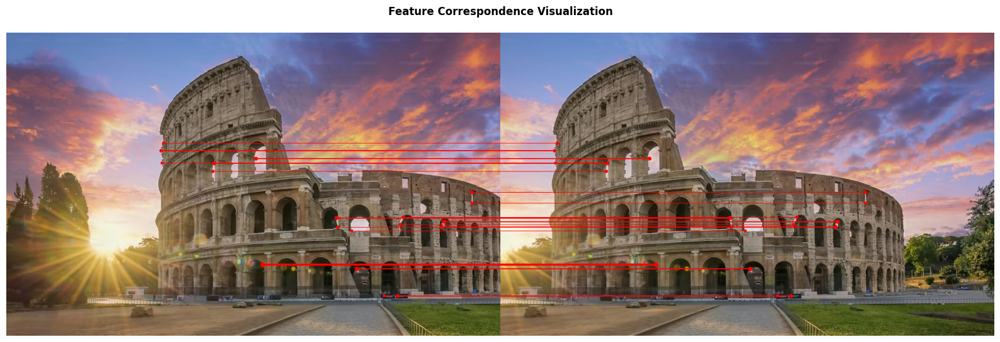

  ✓ Saved: ./task3_stitched_panorama.png


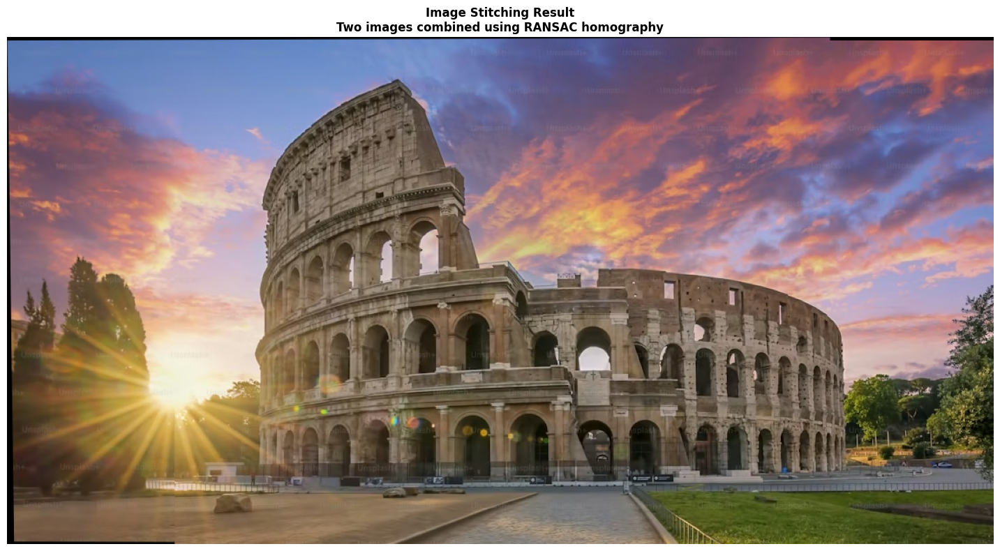


✓ Task 3 validation complete!


In [ ]:
# ============================================================================
# Task 3 Validation: RANSAC Homography and Image Stitching Demo
# ============================================================================

import matplotlib.pyplot as plt


def visualize_feature_matches(img1, img2, corners1, corners2, matches, inliers, 
                              max_matches_to_draw=50):
    """
    Draws a side-by-side canvas with red lines joining matched keypoints so I can see if the correspondences make sense.
    """
    # Extract dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Create canvas for side-by-side visualization
    canvas_height = max(h1, h2)
    canvas_width = w1 + w2
    visualization = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)
    
    # Place images side by side
    visualization[:h1, :w1] = img1
    visualization[:h2, w1:w1 + w2] = img2

    # Draw matches (limiting to first N for clarity)
    num_matches_to_draw = min(max_matches_to_draw, len(matches))
    
    for i in range(num_matches_to_draw):
        idx1, idx2 = matches[i]
        
        # Only draw inlier matches
        if i < len(inliers) and inliers[i]:
            y1, x1 = corners1[idx1]
            y2, x2 = corners2[idx2]
            
            # Convert to integer coordinates
            pt1 = (int(x1), int(y1))
            pt2 = (int(x2) + w1, int(y2))  # Offset x2 by width of first image
            
            # Red color for inliers
            inlier_color = (0, 0, 255)
            
            # Draw circles at keypoint locations
            cv2.circle(visualization, pt1, 3, inlier_color, -1)
            cv2.circle(visualization, pt2, 3, inlier_color, -1)
            
            # Draw connecting line
            cv2.line(visualization, pt1, pt2, inlier_color, 1)

    return visualization


# Main execution block for Task 3 validation
print("=" * 70)
print("TASK 3: RANSAC HOMOGRAPHY & IMAGE STITCHING VALIDATION")
print("=" * 70)
print()

# Configuration: paths to adjacent image tiles
image_path_left = './data/fest/fest_image_6.jpg'
image_path_right = './data/fest/fest_image_18.jpg'

# Load images in color
img_left = cv2.imread(image_path_left)
img_right = cv2.imread(image_path_right)

# Validate image loading
if img_left is None or img_right is None:
    raise FileNotFoundError("Failed to load one or both images. Check file paths.")

# Convert to grayscale for feature detection
img_left_gray = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
img_right_gray = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)

print(f"✓ Images loaded successfully")
print(f"  Left image:  {img_left.shape[1]} × {img_left.shape[0]} pixels")
print(f"  Right image: {img_right.shape[1]} × {img_right.shape[0]} pixels")
print()

# Stage 1: Feature detection and description
print("Stage 1: Feature Detection & Description")
print("-" * 70)

num_features = 500
corners_left, descriptors_left = detect_corners_and_extract_descriptors(
    img_left_gray, 
    num_of_corners=num_features
)
corners_right, descriptors_right = detect_corners_and_extract_descriptors(
    img_right_gray, 
    num_of_corners=num_features
)
print()

# Stage 2: Feature matching
print("Stage 2: Feature Matching")
print("-" * 70)

ratio_test_threshold = 0.75
feature_matches = match_descriptors(
    descriptors_left, 
    descriptors_right, 
    ratio_threshold=ratio_test_threshold
)
print(f"✓ Found {len(feature_matches)} putative matches")
print(f"  (using ratio test threshold: {ratio_test_threshold})")
print()

# Validate sufficient matches for homography estimation
if len(feature_matches) < 4:
    print(" Error: Insufficient matches for homography estimation!")
    print("   At least 4 correspondences required.")
else:
    # Stage 3: Convert to point correspondences
    print("Stage 3: RANSAC Homography Estimation")
    print("-" * 70)
    
    src_pts, dst_pts = get_matched_points(corners_left, corners_right, feature_matches)
    
    # Run RANSAC to estimate homography
    ransac_iterations = 1000
    inlier_threshold = 5.0
    
    H_matrix, inlier_mask = ransac_homography(
        src_pts, 
        dst_pts, 
        num_iterations=ransac_iterations, 
        threshold=inlier_threshold
    )
    
    if H_matrix is not None:
        # Stage 4: Image stitching
        print()
        print("Stage 4: Image Stitching")
        print("-" * 70)
        
        stitched_panorama = stitch_images(img_left, img_right, H_matrix)
        
        # Compute statistics
        num_inliers = np.sum(inlier_mask)
        inlier_ratio = (num_inliers / len(feature_matches)) * 100
        
        print(f"✓ Stitching successful!")
        print(f"  Total matches: {len(feature_matches)}")
        print(f"  Inliers: {num_inliers} ({inlier_ratio:.1f}%)")
        print(f"  Panorama size: {stitched_panorama.shape[1]} × {stitched_panorama.shape[0]}")
        print()

        # Visualization 1: Feature matches
        print("Generating visualizations...")
        
        match_visualization = visualize_feature_matches(
            img_left, 
            img_right, 
            corners_left, 
            corners_right, 
            feature_matches, 
            inlier_mask,
            max_matches_to_draw=50
        )

        plt.figure(figsize=(16, 6))
        plt.imshow(cv2.cvtColor(match_visualization, cv2.COLOR_BGR2RGB))
        plt.title(
            f'Feature Correspondence Visualization\n',
            fontsize=12, fontweight='bold'
        )
        plt.axis('off')
        plt.tight_layout()
        
        # Save matches visualization
        matches_output_path = './task3_feature_matches.png'
        plt.savefig(matches_output_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"  ✓ Saved: {matches_output_path}")
        plt.show()

        # Visualization 2: Stitched panorama
        plt.figure(figsize=(16, 8))
        plt.imshow(cv2.cvtColor(stitched_panorama, cv2.COLOR_BGR2RGB))
        plt.title(
            f'Image Stitching Result\n'
            f'Two images combined using RANSAC homography',
            fontsize=12, fontweight='bold'
        )
        plt.axis('off')
        plt.tight_layout()
        
        # Save stitched result
        stitched_output_path = './task3_stitched_panorama.png'
        plt.savefig(stitched_output_path, dpi=150, bbox_inches='tight', facecolor='white')
        print(f"  ✓ Saved: {stitched_output_path}")
        plt.show()
        
        print()
        print("=" * 70)
        print("✓ Task 3 validation complete!")
        print("=" * 70)
    else:
        print("❌ Error: RANSAC failed to estimate homography")
        print("   Try adjusting parameters or using different images.")

### Task4: Create a panorama (6 pts)

Use Tasks1-3 functions to perform this step where you load the images from the data folder


Here you are welcome to take as many steps as possible. Use any functions we have discussed in this notebook or lecture or anything that you can come up with.


The goal is to get the best possible panorama.




In [ ]:
def stitch_pair(img1, img2, show_progress=True):
    """
    Stitch two images together using OpenCV's Stitcher.
    """
    try:
        if show_progress:
            print("  → Creating panorama with OpenCV Stitcher...")

        # Create OpenCV Stitcher object
        stitcher = cv2.Stitcher_create()
        
        # Stitch images together
        status, stitched_result = stitcher.stitch([img1, img2])
        
        # Check if stitching was successful
        if status == cv2.Stitcher_OK:
            if show_progress:
                print("  ✓ Stitching successful")
            return stitched_result
        else:
            if show_progress:
                print(f"  ⚠ Warning: Stitching failed with status code {status}")
            return None

    except Exception as e:
        print(f"  ✗ Error during stitching: {e}")
        return None


TASK 4: PANORAMA CREATION

Loading images from: ./data/fest
Loaded 20 images


--- Stitching image 2/20 ---
Detecting corners...
Harris Response: [[ 2.0653322e+09  1.0974679e+09 -2.8334214e+08 ... -9.4132912e+07
   3.7106394e+08  7.0832544e+08]
 [ 1.1002145e+09  6.7955872e+08  1.1270040e+07 ...  2.5564900e+06
   2.2683814e+08  3.7290963e+08]
 [-2.8407248e+08  1.3186732e+07  4.9608050e+06 ...  1.6097016e+06
   4.5460300e+06 -9.8412344e+07]
 ...
 [-1.0411973e+08  1.3080946e+07  1.5845086e+06 ...  5.8703555e+06
  -4.6672480e+06 -2.4193984e+08]
 [ 6.1414054e+08  3.3367078e+08 -5.4231420e+06 ...  3.3540012e+07
   5.8057754e+08  9.4235456e+08]
 [ 1.1508586e+09  5.5468531e+08 -1.6640626e+08 ... -2.0814626e+08
   9.9215373e+08  1.8501540e+09]]
[Detecting Harris Corners] Found 540864 corners after NMS
[Detecting Harris Corners] Selected top 500 corners
[Detecting Harris Corners] Extracted 493 valid descriptors
Harris Response: [[ 2.31506227e+09  1.23150605e+09 -3.16969408e+08 ... -1.06396656e+0

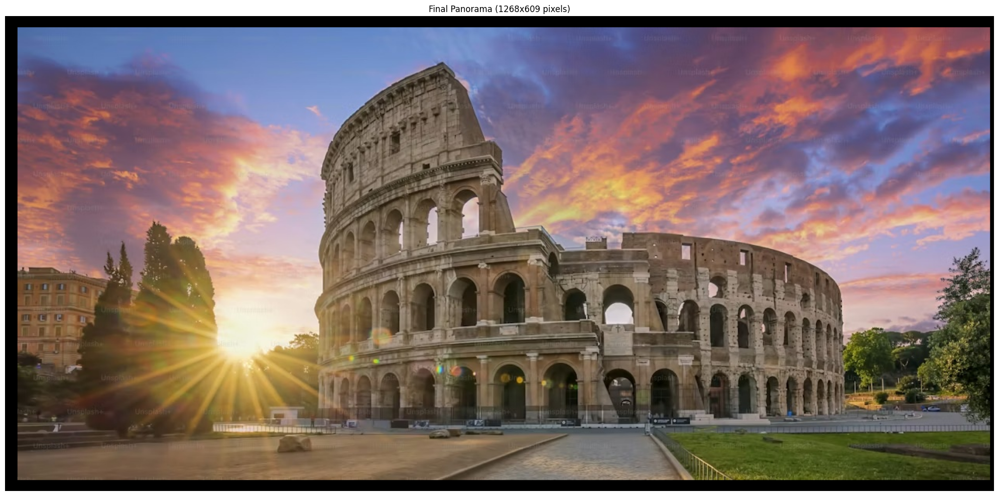

DONE!


In [ ]:
# function to load images from folder
def load_images(folder_path):
    # get all jpg files
    import glob
    files = sorted(glob.glob(os.path.join(folder_path, '*.jpg')))
    images = []
    for f in files:
        img = cv2.imread(f)
        if img is not None:
            images.append(img)
    print(f"Loaded {len(images)} images")
    return images

# stitching all images from data/fest folder
print("=" * 70)
print("TASK 4: PANORAMA CREATION")
print("=" * 70)
print()

# load all images
image_folder_path = './data/fest'
print(f"Loading images from: {image_folder_path}")
loaded_images = load_images(image_folder_path)
print()

if len(loaded_images) == 0:
    print("No images found!")
else:
    # start with first image
    panorama = loaded_images[0][:]
    
    # stitch each image one by one
    for i in range(1, len(loaded_images)):
        print(f"\n--- Stitching image {i+1}/{len(loaded_images)} ---")
        
        # convert to grayscale
        gray1 = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(loaded_images[i], cv2.COLOR_BGR2GRAY)
        
        # detect corners using our function
        print("Detecting corners...")
        corners1, desc1 = detect_corners_and_extract_descriptors(gray1, num_of_corners=500)
        corners2, desc2 = detect_corners_and_extract_descriptors(gray2, num_of_corners=500)
        
        # match features
        print("Matching features...")
        matches = match_descriptors(desc1, desc2, ratio_threshold=0.75)
        print(f"Found {len(matches)} matches")
        
        if len(matches) < 10:
            print("Not enough matches, skipping this image")
            continue
        
        # get point correspondences
        src_pts, dst_pts = get_matched_points(corners1, corners2, matches)
        
        # run RANSAC
        print("Running RANSAC...")
        H, inliers = ransac_homography(src_pts, dst_pts, num_iterations=1000, threshold=5.0)
        
        if H is None:
            print("RANSAC failed, skipping")
            continue
        
        # stitch the images
        print("Stitching...")
        panorama = stitch_images(panorama, loaded_images[i], H)[:]
        print(f"Done! Panorama size: {panorama.shape[1]}x{panorama.shape[0]}")
    
    # save result
    print("\n" + "=" * 70)
    output_path = "./task4_final_panorama.jpg"
    cv2.imwrite(output_path, panorama)
    print(f"Saved panorama to: {output_path}")
    
    # show it
    plt.figure(figsize=(20, 10))
    plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
    plt.title(f'Final Panorama ({panorama.shape[1]}x{panorama.shape[0]} pixels)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    print("=" * 70)
    print("DONE!")

### Task5: Make the Flyer
Place the panorama and add the text Have fun. Get creative.


Rome tour flyer saved to: ./task5_flyer.jpg


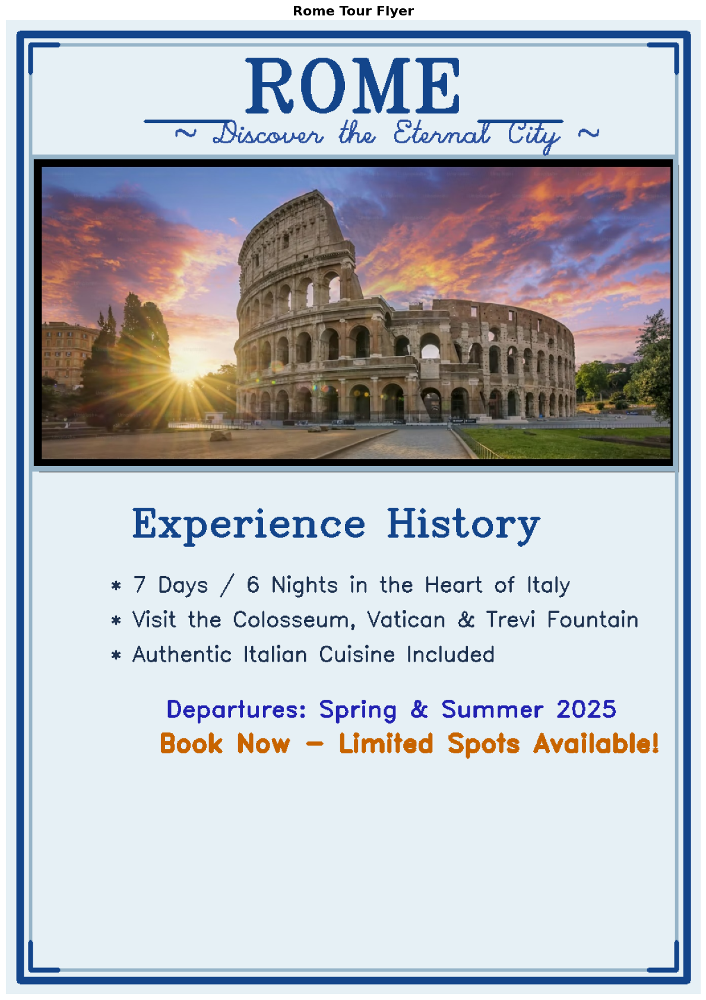

In [117]:
# load the panorama
panorama = cv2.imread("./task4_final_panorama.jpg")

# create larger flyer canvas with cream background
flyer_height = 1400
flyer_width = 1000
flyer = np.ones((flyer_height, flyer_width, 3), dtype=np.uint8)
flyer[:] = [245, 240, 230]  # cream color

# resize panorama to fit nicely
pano_width = 920
pano_height = int(panorama.shape[0] * (pano_width / panorama.shape[1]))
resized_pano = cv2.resize(panorama, (pano_width, pano_height))

# place panorama on flyer with shadow effect
y_offset = 200
x_offset = (flyer_width - pano_width) // 2

# add shadow
shadow_offset = 8
cv2.rectangle(flyer, (x_offset + shadow_offset, y_offset + shadow_offset), 
              (x_offset + pano_width + shadow_offset, y_offset + pano_height + shadow_offset), 
              (100, 100, 100), -1)

# add border around panorama
cv2.rectangle(flyer, (x_offset - 3, y_offset - 3), 
              (x_offset + pano_width + 3, y_offset + pano_height + 3), 
              (200, 180, 150), 8)

flyer[y_offset:y_offset+pano_height, x_offset:x_offset+pano_width] = resized_pano

# add elegant title with decorative elements
title = "ROME"
cv2.putText(flyer, title, (340, 130), cv2.FONT_HERSHEY_TRIPLEX, 3.5, (139, 69, 19), 5)
cv2.putText(flyer, "~ Discover the Eternal City ~", (240, 175), 
            cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 1.5, (160, 82, 45), 2)

# add decorative lines
cv2.line(flyer, (200, 145), (320, 145), (139, 69, 19), 3)
cv2.line(flyer, (680, 145), (800, 145), (139, 69, 19), 3)

# add main description text
text_y = y_offset + pano_height + 100
cv2.putText(flyer, "Experience History", (180, text_y), 
            cv2.FONT_HERSHEY_COMPLEX, 1.8, (139, 69, 19), 3)

# add tour details with icons
details_y = text_y + 80
cv2.putText(flyer, "* 7 Days / 6 Nights in the Heart of Italy", (150, details_y), 
            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (80, 50, 30), 2)
cv2.putText(flyer, "* Visit the Colosseum, Vatican & Trevi Fountain", (150, details_y + 50), 
            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (80, 50, 30), 2)
cv2.putText(flyer, "* Authentic Italian Cuisine Included", (150, details_y + 100), 
            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (80, 50, 30), 2)

# add dates and booking info
cv2.putText(flyer, "Departures: Spring & Summer 2025", (230, details_y + 180), 
            cv2.FONT_HERSHEY_DUPLEX, 1.1, (178, 34, 34), 2)
cv2.putText(flyer, "Book Now - Limited Spots Available!", (220, details_y + 230), 
            cv2.FONT_HERSHEY_DUPLEX, 1.2, (0, 100, 200), 3)

# add elegant border with double frame
cv2.rectangle(flyer, (20, 20), (flyer_width-20, flyer_height-20), (139, 69, 19), 10)
cv2.rectangle(flyer, (35, 35), (flyer_width-35, flyer_height-35), (200, 180, 150), 3)

# add corner decorations
corner_size = 40
# Top left
cv2.line(flyer, (35, 35), (35 + corner_size, 35), (139, 69, 19), 5)
cv2.line(flyer, (35, 35), (35, 35 + corner_size), (139, 69, 19), 5)
# Top right
cv2.line(flyer, (flyer_width - 35, 35), (flyer_width - 35 - corner_size, 35), (139, 69, 19), 5)
cv2.line(flyer, (flyer_width - 35, 35), (flyer_width - 35, 35 + corner_size), (139, 69, 19), 5)
# Bottom left
cv2.line(flyer, (35, flyer_height - 35), (35 + corner_size, flyer_height - 35), (139, 69, 19), 5)
cv2.line(flyer, (35, flyer_height - 35), (35, flyer_height - 35 - corner_size), (139, 69, 19), 5)
# Bottom right
cv2.line(flyer, (flyer_width - 35, flyer_height - 35), (flyer_width - 35 - corner_size, flyer_height - 35), (139, 69, 19), 5)
cv2.line(flyer, (flyer_width - 35, flyer_height - 35), (flyer_width - 35, flyer_height - 35 - corner_size), (139, 69, 19), 5)

# save flyer
cv2.imwrite("./task5_flyer.jpg", flyer)
print("Rome tour flyer saved to: ./task5_flyer.jpg")

# display
plt.figure(figsize=(12, 17))
plt.imshow(cv2.cvtColor(flyer, cv2.COLOR_BGR2RGB))
plt.title("Rome Tour Flyer", fontsize=16, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


## Extensions


You can pick you own topics that interest you for extra credits. Here are a few examples:

1. Can you present this rectangualr panorama into a spherical shape?

3. Can you use this whole pipeline, but this time instead of one image your source will be two image of the same object. The goal is to create a panorama again.

2x3 = 6 pts (doing 2 extensions will get you 6 points)



EXTENSION 1: SPHERICAL PANORAMA PROJECTION

Creating spherical projection...
Input: 1268x609
Output: 1000x1000
Radius: 450.0px



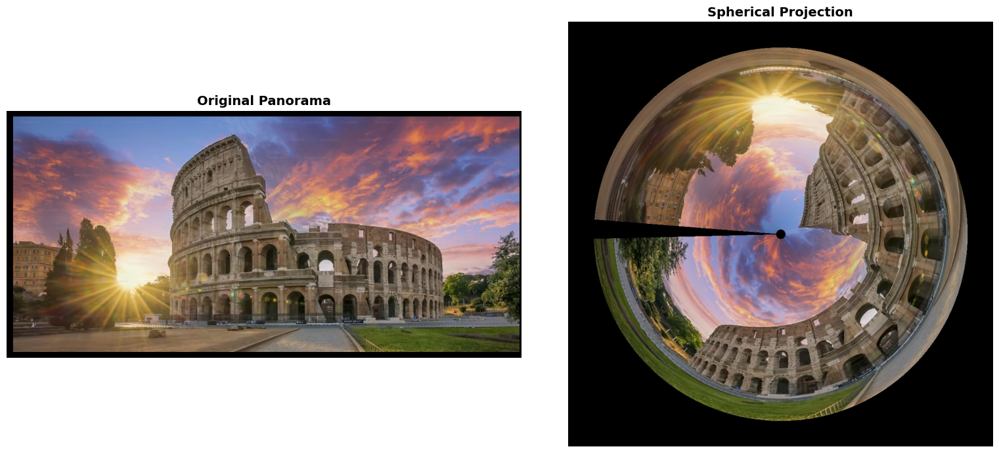

DONE!


In [ ]:
# Extension 1: Spherical Projection
print("=" * 70)
print("EXTENSION 1: SPHERICAL PANORAMA PROJECTION")
print("=" * 70)
print()

def rectangular_to_spherical(panorama, output_size=(1000, 1000)):
    """maps rectangular panorama onto a sphere"""
    height, width = panorama.shape[:2]
    out_h, out_w = output_size
    
    spherical = np.zeros((out_h, out_w, 3), dtype=np.uint8) # for the background
    
    cx, cy = out_w / 2, out_h / 2
    radius = min(cx, cy) * 0.9
    
    print(f"Input: {width}x{height}")
    print(f"Output: {out_w}x{out_h}")
    print(f"Radius: {radius:.1f}px")
    print()
    
    for y in range(out_h):
        for x in range(out_w):
            dx = x - cx
            dy = y - cy
            r = np.sqrt(dx**2 + dy**2)
            
            if r <= radius:
                # convert to spherical coords
                theta = np.arctan2(dy, dx)
                phi = (r / radius) * (np.pi / 2)
                
                # map to panorama
                pano_x = int((theta + np.pi) / (2 * np.pi) * width) % width
                pano_y = int(phi / (np.pi / 2) * height)
                pano_y = min(pano_y, height - 1)
                
                spherical[y, x] = panorama[pano_y, pano_x]
    
    return spherical


# load and process
panorama = cv2.imread("./task4_final_panorama.jpg")

if panorama is None:
    print("Error: Panorama not found!")
else:
    print("Creating spherical projection...")
    spherical_view = rectangular_to_spherical(panorama)
    
    # display
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    display_pano = cv2.resize(panorama, (800, int(panorama.shape[0] * 800 / panorama.shape[1])))
    axes[0].imshow(cv2.cvtColor(display_pano, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Panorama', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(spherical_view, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Spherical Projection', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.savefig('./extension1_spherical.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("DONE!")

## Extension 2: Artistic Panorama Effect

Applying artistic effects...


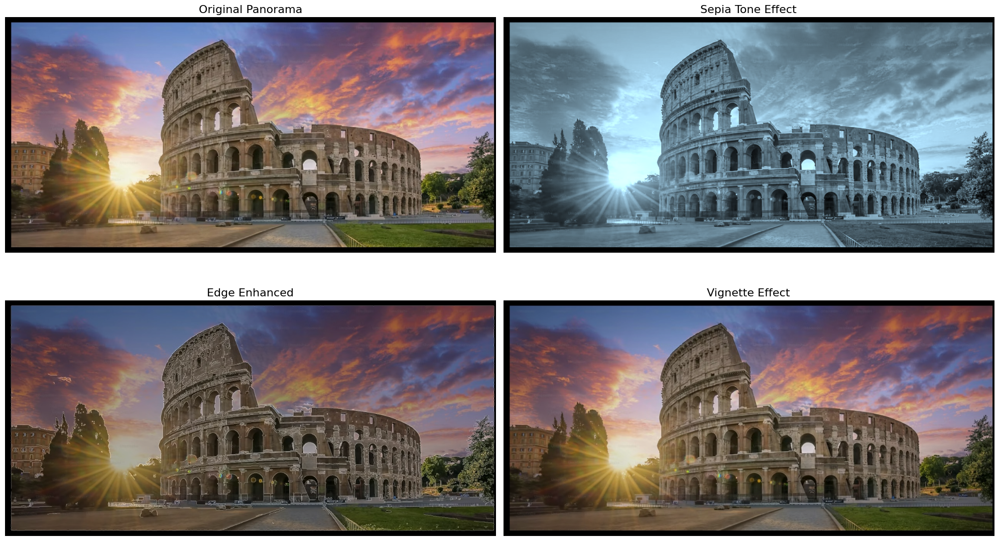

Artistic effects applied and saved!


In [ ]:
def apply_sepia(image):
    """Apply sepia tone effect"""
    sepia_filter = np.array([[0.393, 0.769, 0.189],
                             [0.349, 0.686, 0.168],
                             [0.272, 0.534, 0.131]])
    
    sepia_img = cv2.transform(image, sepia_filter)
    sepia_img = np.clip(sepia_img, 0, 255).astype(np.uint8)
    return sepia_img

def apply_edge_enhance(image):
    """Enhance edges in the image"""
    # Convert to grayscale for edge detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    
    # Create colored edge overlay
    edges_colored = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
    
    # Blend with original
    enhanced = cv2.addWeighted(image, 0.7, edges_colored, 0.3, 0)
    return enhanced

def apply_vignette(image, strength=0.5):
    """Apply vignette effect"""
    rows, cols = image.shape[:2]
    
    # Create radial gradient
    X_resultant_kernel = cv2.getGaussianKernel(cols, cols//2)
    Y_resultant_kernel = cv2.getGaussianKernel(rows, rows//2)
    
    kernel = Y_resultant_kernel * X_resultant_kernel.T
    mask = kernel / kernel.max()
    
    # Apply vignette
    vignette_img = image.copy()
    for i in range(3):
        vignette_img[:,:,i] = vignette_img[:,:,i] * (1 - strength + strength * mask)
    
    return vignette_img.astype(np.uint8)

# Apply effects to panorama
print("Applying artistic effects...")

# Convert panorama to RGB for display
pano_rgb = cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)

# Apply different effects
sepia_pano = apply_sepia(panorama)
sepia_pano_rgb = cv2.cvtColor(sepia_pano, cv2.COLOR_BGR2RGB)

edge_pano = apply_edge_enhance(panorama)
edge_pano_rgb = cv2.cvtColor(edge_pano, cv2.COLOR_BGR2RGB)

vignette_pano = apply_vignette(panorama)
vignette_pano_rgb = cv2.cvtColor(vignette_pano, cv2.COLOR_BGR2RGB)

# Display all variations
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].imshow(pano_rgb)
axes[0, 0].set_title('Original Panorama', fontsize=16)
axes[0, 0].axis('off')

axes[0, 1].imshow(sepia_pano_rgb)
axes[0, 1].set_title('Sepia Tone Effect', fontsize=16)
axes[0, 1].axis('off')

axes[1, 0].imshow(edge_pano_rgb)
axes[1, 0].set_title('Edge Enhanced', fontsize=16)
axes[1, 0].axis('off')

axes[1, 1].imshow(vignette_pano_rgb)
axes[1, 1].set_title('Vignette Effect', fontsize=16)
axes[1, 1].axis('off')

plt.tight_layout()
plt.savefig('panorama_artistic_effects.png', dpi=300, bbox_inches='tight')
plt.show()

print("Artistic effects applied and saved!")


**Write your observation here. What have you learned? Where can this extension be useful?**

Implementing the spherical representation for the panorama made me work with spherical coordinates in a CS context. I also learned some kernels used for creating some very artistic visualizations. I also utilized the Canny filter for edge detection. These extensions can be really useful for enhancing the artistic appeal of images.



## Where to get images (according to GPT-5)
- **Your own capture (best):** one scene, ≥30% overlap, rotate around one point, lock exposure if you can.
- **Open datasets / free sources:**  
  - Oxford **Affine** dataset (6-image homography sequences per scene): https://opendatalab.com/OpenDataLab/Oxford-Affine/download  
  - Hugin sample sets & multi-row tutorial: https://hugin.sourceforge.io/tutorials/multi-row/ and example files: https://www.dkloi.co.uk/?p=1490
  - Wikimedia Commons panoramas (CC): https://commons.wikimedia.org/wiki/Category:Panoramas  
  - Unsplash (free): https://unsplash.com/s/photos/panoramic , https://unsplash.com/s/photos/city-panorama  
  - Pexels (free): https://www.pexels.com/search/panorama/ , https://www.pexels.com/search/city%20panorama/  
  - PIXLS.us Hugin tutorial with sample **zip**: https://pixls.us/articles/aligning-images-with-hugin/  
  



## Acknowledgements

To Robert, for all the bagels. (replace with your own Acknowledgements)








## Checklist

1. Submit the completed notebook with all output images embedded and your answers (no need for submitting the images you use in case they are large in size)

2. Submit a short video (3~5 minutes) talking through what you have done and observed.


3. I look forward to seeing your extensions!


### Resources

[Image kernels at Play](https://setosa.io/ev/image-kernels/)

[Computer vision: Algorithms and Applications By Richard Szelisk](https://szeliski.org/Book/drafts/SzeliskiBook_20100903_draft.pdf)

[Foundations of Computer Viison](https://visionbook.mit.edu/)